In [1]:
import PIL.Image
import numpy as np
from typing import Union
from glob import glob
import os

# [IAPR][iapr]: Project


**Group ID:** 15

**Author 1 (sciper):** Tom Mery (297217)  
**Author 2 (sciper):** Gabriel Margaria (299895)   
**Author 3 (sciper):** Théo Hermann (282844)   

**Release date:** 27.04.2023


## Important notes

The assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

---
## 0. Introduction

In this project, you will be working on solving tiling puzzles using image analysis and pattern recognition techniques. Tiling puzzles are a classic type of puzzle game that consists of fitting together pieces of a given shape (in this case squared to form a complete image. The goal of this project is to develop an algorithm that can automatically reconstruct tiling puzzles from a single input image. 

---

## 1. Data

### Input data
To achieve your task, you will be given images that look like this:


![train_00.png](data_project/project_description/train_00.png)

### Example puzzle content
Example of input of solved puzzles. 
Solution 1
<img src="data_project/project_description/solution_example.png" width="512"/>
Solution 2
<img src="data_project/project_description/solution_example2.jpg" width="512"/>


### 1.1. Image layout

- The input for the program will be a single image with a size of __2000x2000 pixels__, containing the pieces of the tiling puzzles randomly placed in it. The puzzles sizes vary from __3x3, 3x4, or 4x4__ size. 
    -__You are guaranteed to always have the exact number of pieces for each puzzle__ 
        -For each puzzle you always are expected to find exaclty 9,12,16 pieces
        -If you find something else, either you are missing pieces, or added incorrect pieces for the puzzle

- The puzzle pieces are square-shaped with dimensions of 128x128 pixels (before rotation). 

- The input image will contain pieces from __two or three (but never four)__ different tiling puzzles, as well as some __extra pieces (outliers)__ that do not belong to either puzzle.


## 2. Tasks (Total 20 points) 


The project aims to:
1) Segment the puzzle pieces from the background (recover the pieces of 128x128 pixels)   \[ __5 points__ \] 

2) Extract features of interest from puzzle pieces images \[ __5 points__ \]   

3) Cluster puzzle pieces to identify which puzzle they belong, and identify outliers.  \[ __5 points__ \]   

4) Solve tiling puzzle (find the rotations and translations to correctly allocate the puzzle pieces in a 3x3, 3x4 or 4x4 array.) \[ __5 points__ \]   

##### The images used for the puzzles have self-repeating patterns or textures, which ensures that all puzzle pieces contain more or less the same features regardless of how they were cut. 




### 1.2. Output solution pieces.

For each inpute image, the output solution will include N images with solved puzzles, where N is the number of puzzles in the input image. and M images, that are Each of these images will contain the solved solution to one of the N puzzles in the input. 


-  Example input:  train_05.png

- Example solution:
        -solution_05_00.png solution_05_01.png solution_05_02.png 
        -outlier_05_00.png outlier_05_01.png outlier_05_02.png ...

- Example input:  train_07.png
- Example solution:
        -solution_07_00.png solution_07_01.png 
        -outlier_07_00.png outlier_07_01.png outlier_07_02.png ...


__Watch out!__ output resolution should always be like this:  
<table ><tr><th >Puzzle pieces <th><th> pixel dimentions <th> <th> pixel dimentions <th> <tr>
<tr><td> 3x3 <td><td> 384x384 <td><td> 3(128)x3(128) <td> <tr>
<tr><td> 3x4 <td><td> 384x512 <td><td> 3(128)x4(128)<tr>
<tr><td> 4x4 <td><td> 512x512 <td><td> 4(128)x4(128)<tr>
<tr><td> 1x1 (outlier)<td><td> 128x128 <td><td> (1)128x(1)128 <td><tr><table>





__Order of the solutions (and rotations) it's not a problem for the grading__




the output solution will be a final image of resolution (1283)x(1283), with each piece correctly placed in its corresponding location in the 3x3 array. Similarly, if the puzzle consists of 3x4 or 4x4 pieces, the output solution will be an image of resolution (1283)x(1284) or (1284)x(1284)



### 1.3 Data folder Structure

You can download the data for the project here: [download data](https://drive.google.com/drive/folders/1k3xTH0ZhpqZb3xcZ6wsOSjLzxBNYabg3?usp=share_link)

```
data_project
│
└─── project_description
│    │    example_input.png      # example input images
│    │    example_textures1.png      # example input images
│    │    example_textures2.png      # example input images
│    └─── ultimate_test.jpg   # If it works on that image, you would probably end up with a good score
│
└─── train
│    │    train_00.png        # Train image 00
│    │    ...
│    │    train_16.png        # Train image 16
│    └─── train_labels.csv    # Ground truth of the train set
|    
└────train_solution
│    │    solution_00_00.png        # Solution puzzle 1 from Train image 00
│    │    solution_00_01.png        # Solution puzzle 2 from Train image 00
│    │    solution_00_02.png        # Solution Puzzle 3 from Train image 00
│    │    outlier_00_00.png         # outlier     from Train image 00
│    │    outlier_00_01.png         # outlier     from Train image 00
│    │    outlier_00_03.png         # outlier     from Train image 00
│    │    ...
│    │    solution_15_00.png        # Solution puzzle 1 from Train image 15
│    │    solution_15_01.png        # Solution puzzle 2 from Train image 15
│    │    outlier_15_00.png         # outlier     from Train image 15
│    └─── outlier_15_01.png         # outlier     from Train image 15
│
└─── test
     │    test_00.png         # Test image 00 (day of the exam only)
     │    ...
     └─── test_xx.png             # Test image xx (day of the exam only)
```



## 3. Evaluation

**Before the exam**
   - Create a zipped folder named **groupid_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam**
   - You will be given a **new folder** (test folder) with few images, but **no ground truth** (no solutions).
   - We will ask you to run your pipeline in **real time** and to send us your prediction of the task you obtain with the provided function **save_results**. 
   - On our side, we will compute the performance of your classification algorithm. 
   - To evaluate your method, we will use the **evaluate_solution** function presented below. To understand how the provided functions work, please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty on the day of the exam**. 
---


## 4. Your code

In [2]:
## load images
import os 
from PIL import Image


import numpy as np
import matplotlib.pyplot as plt

In [3]:
def load_input_image(image_index ,  folder ="train" , path = "data_project"):
    
    filename = "train_{}.png".format(str(image_index).zfill(2))
    path_solution = os.path.join(path,folder , filename )
    
    im= Image.open(os.path.join(path,folder,filename)).convert('RGB')
    im = np.array(im)
    return im

def save_solution_puzzles(image_index , solved_puzzles, outliers  , folder ="train" , path = "data_project"  ,group_id = 0):
    
    path_solution = os.path.join(path,folder + "_solution_{}".format(str(group_id).zfill(2)))
    if not  os.path.isdir(path_solution):
        os.mkdir(path_solution)

    print(path_solution)
    for i, puzzle in enumerate(solved_puzzles):
        filename =os.path.join(path_solution, "solution_{}_{}.png".format(str(image_index).zfill(2), str(i).zfill(2)))
        Image.fromarray(puzzle).save(filename)

    for i , outlier in enumerate(outliers):
        filename =os.path.join(path_solution, "outlier_{}_{}.png".format(str(image_index).zfill(2), str(i).zfill(2)))
        Image.fromarray(outlier).save(filename)

In [4]:
def solve_and_export_puzzles_image(image_index , folder = "train" , path = "data_project"  , group_id = "00"):
    """
    Wrapper funciton to load image and save solution
            
    Parameters
    ----------
    image:
        index number of the dataset

    Returns
    """

      # open the image
    image_loaded = load_input_image(image_index , folder = folder , path = path)
    #print(image_loaded)
    
   
    ## call functions to solve image_loaded
    solved_puzzles = [ (np.random.rand(512,512,3)*255).astype(np.uint8)  for i in range(2) ]
    outlier_images = [ (np.random.rand(128,128,3)*255).astype(np.uint8) for i in range(3)]
    
    save_solution_puzzles (image_index , solved_puzzles , outlier_images , folder = folder ,group_id =group_id)
    
   
    
    
    
    return image_loaded , solved_puzzles , outlier_images

im, sol , out = solve_and_export_puzzles_image(6 , group_id = 6)

data_project/train_solution_06


In [5]:
group_id = 0
# Evaluate all images
games_id = [6,10]  # to evaluate  three images

for i in games_id :
    
    print("solving " , i)
    # Saving results
    solve_and_export_puzzles_image(6 , group_id = group_id)
  


solving  6
data_project/train_solution_00
solving  10
data_project/train_solution_00


## Evaluation metrics

The evaluation metrics will be liberated in the following days. 


## Gabor filters

$$ gb(x,y) = \exp \left( -\frac{1}{2} \left( \frac{x_{\theta}^2}{\sigma^2} + \frac{y_{\theta}^2}{(\Gamma\sigma)^2} \right) \right) \cos \left( \frac{2 \pi}{\lambda} x_{\theta} + \psi \right) $$


# Segmentation

In [6]:
import cv2
import numpy as np
import scipy
import skimage.morphology as morph
from skimage.filters import threshold_multiotsu




def segment(image):
    """
    Segments the puzzle pieces from the background of an input image.

    Args:
        image: A numpy array representing the input image.

    Returns:
        A binary image where the puzzle pieces are represented by 1 and the background is represented by 0.
    """
    kernel = np.array([[1, 1, 1], [1, -7, 1], [1, 1, 1]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    sharpened_image = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2GRAY)
    thresholded_bis = cv2.adaptiveThreshold(
    sharpened_image,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=3,
    C=-4)
       

    thresholded_bis = morph.remove_small_holes(thresholded_bis.astype(bool), area_threshold=1000, connectivity=3).astype(np.uint8)
    
    thresholded_bis[thresholded_bis > 0] = 255
    # plt.figure(figsize=(10, 10))
    # plt.imshow(thresholded_bis, cmap='gray')
    # plt.show()
    
    
    # Binarize blurred image with non 0 values set to 255 and 0 values set to 0
    #closing on the thresholded image
    kernel = np.ones((9,9),np.uint8)
    thresholded_bis_closed = cv2.morphologyEx(thresholded_bis, cv2.MORPH_CLOSE, kernel)
    
    return thresholded_bis_closed.astype(np.uint8)



def get_rectangles(img, segmented, height=128, width=128):
    # Find contours
    contours = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    target_area = height*width
    max_err = 0.15     # + ou - 10%

    # Compute rotated rectangle (minimum area)
    rectangles = []
    angles = []
    mask = np.zeros_like(img)
    for cnt in contours:
        rect = cv2.minAreaRect(cnt)
        box = cv2.boxPoints(rect)
        area = cv2.contourArea(box)
        if (area > (1-max_err)*target_area) and (area < (1+max_err)*target_area): 
            rectangles.append(rect)
            cv2.drawContours(mask, [box.astype(int)], 0, (255, 255, 255), thickness=cv2.FILLED)
        
    return rectangles, mask


def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    diag = int(np.ceil(np.sqrt(h**2 + w**2)))
    
    padded = np.zeros((diag, diag, 3), dtype=image.dtype)
    
    yoff = round((diag-h)/2)
    xoff = round((diag-w)/2)
    padded[yoff:yoff+h, xoff:xoff+w, :] = image.copy()
    
    center = (diag / 2, diag / 2)
    M = cv2.getRotationMatrix2D(center,angle,1.0)
    rotated_image = cv2.warpAffine(padded, M, (diag,diag))
    return rotated_image


def crop_image(image, rect):
    box = np.int0(cv2.boxPoints(rect))
    x_min, y_min = np.min(box, axis=0)
    x_max, y_max = np.max(box, axis=0)
    x1 = max(0, x_min)
    y1 = max(0, y_min)
    x2 = min(image.shape[1], x_max)
    y2 = min(image.shape[0], y_max)
    cropped = image[y1:y2, x1:x2]
    return cropped


class Piece:
    def __init__(self, data):
        self.data = data
    
    def rotate(self):
        raise NotImplementedError
    
    def translate(self):
        raise NotImplementedError


def get_piece(image, rect, height=128, width=128):
    # Crop image 
    data = crop_image(image, rect)
    
    # Rotate piece
    angle = rect[2]
    data = rotate_image(data, angle)
    
    # Crop rotated piece
    center = (int(data.shape[0]/2), int(data.shape[1]/2))
    x1 = center[1] - int(width/2)
    y1 = center[0] - int(height/2)
    x2 = center[1] + int(width/2)
    y2 = center[0] + int(height/2)
    data = data[y1:y2, x1:x2]
    
    piece = Piece(data=data)

    return piece

/tmp/ipykernel_5695/1515916619.py:89: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(cv2.boxPoints(rect))


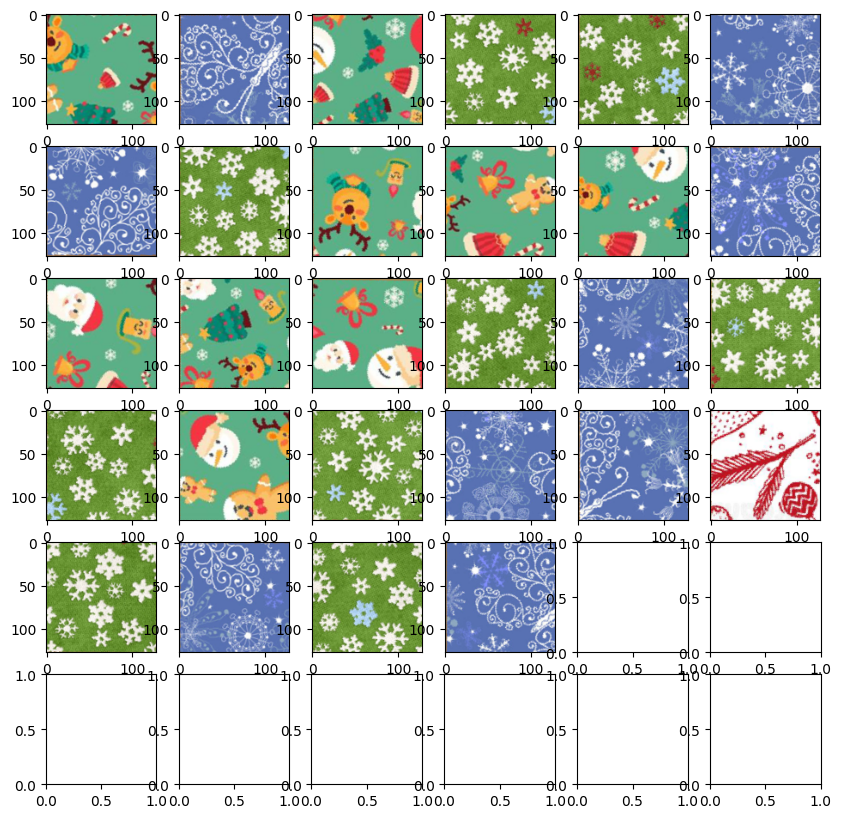

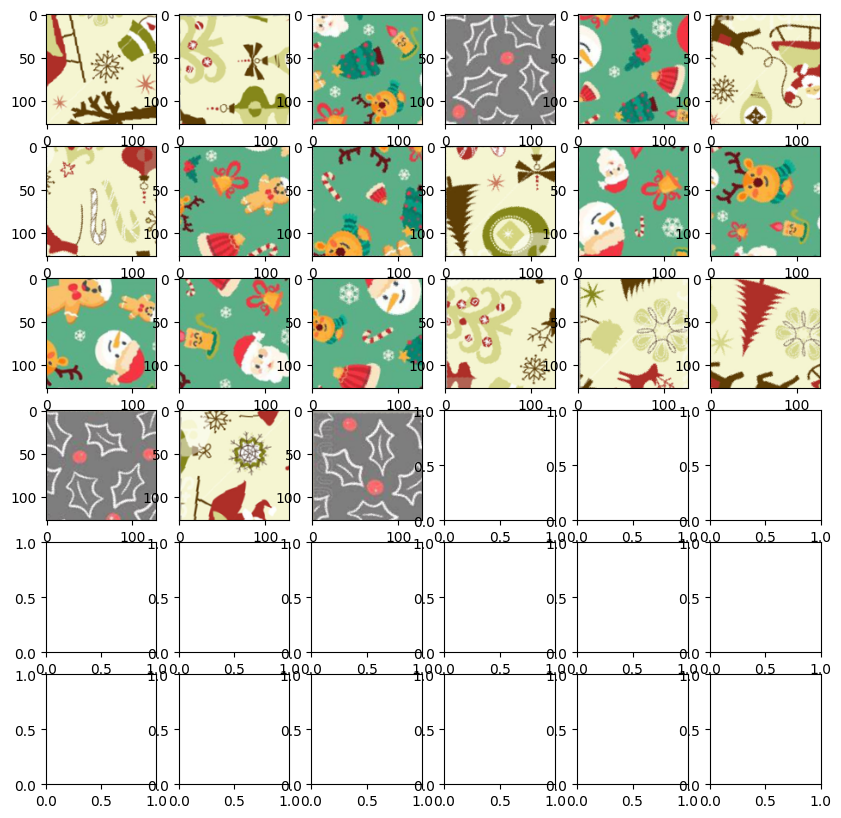

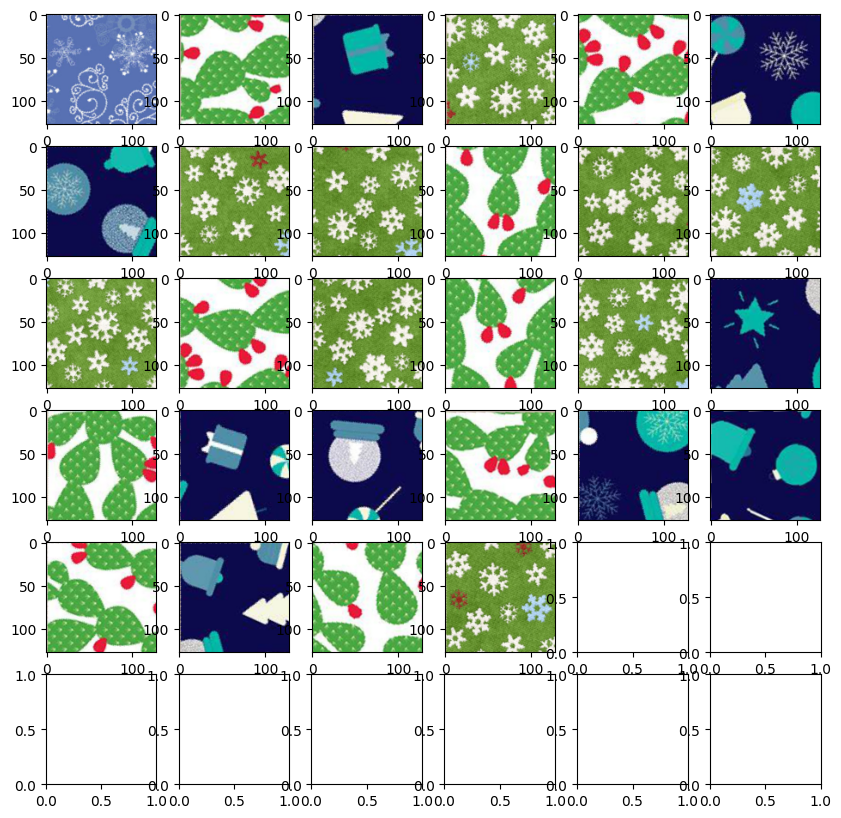

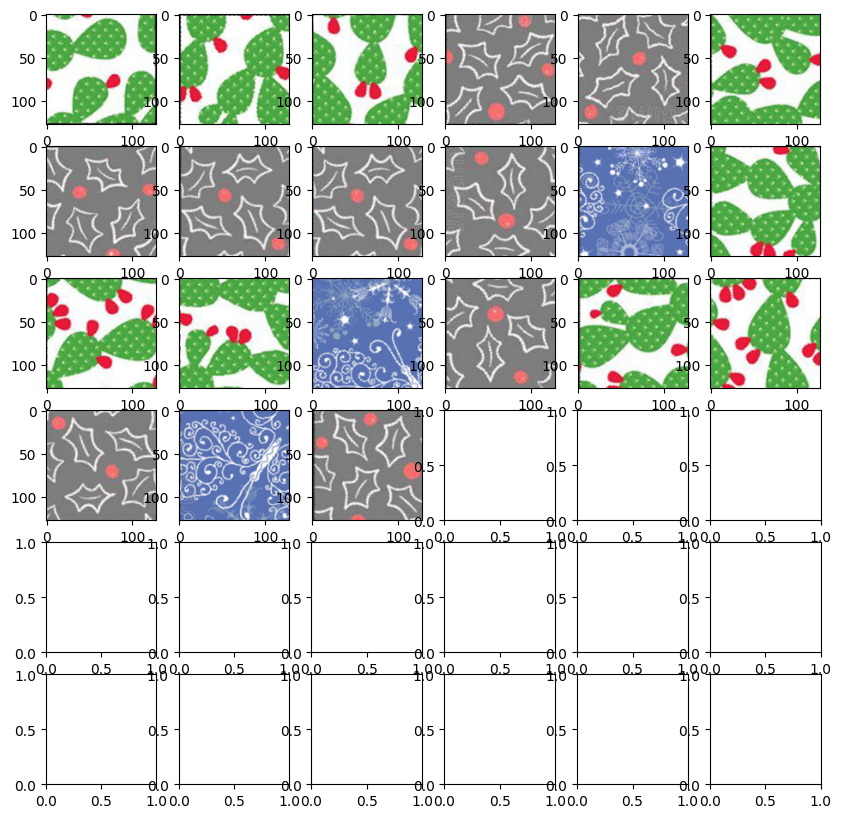

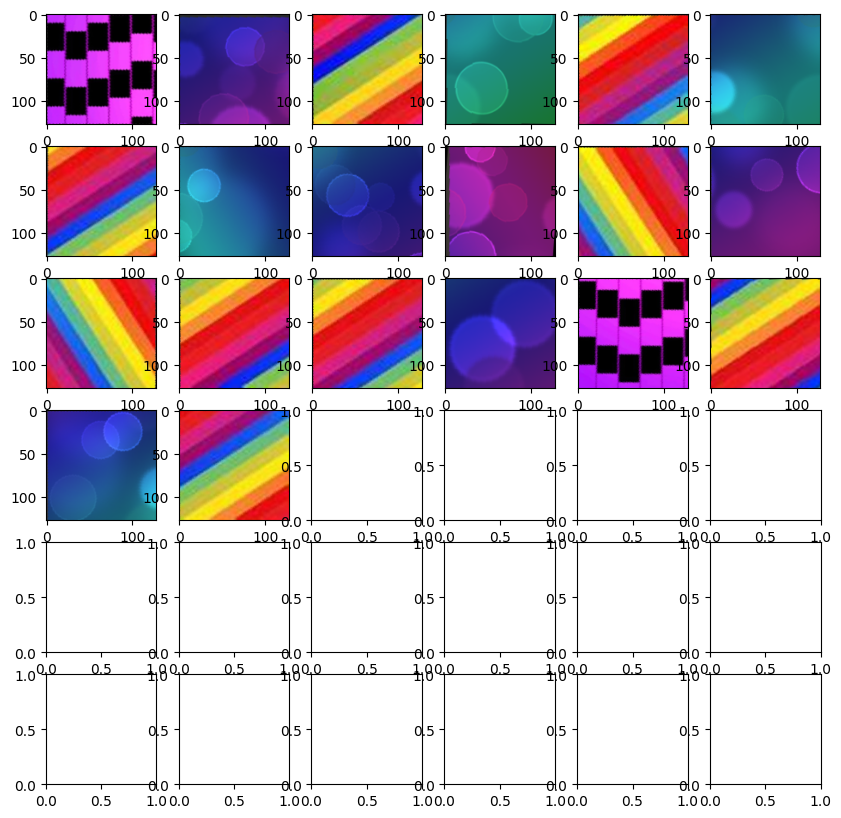

...

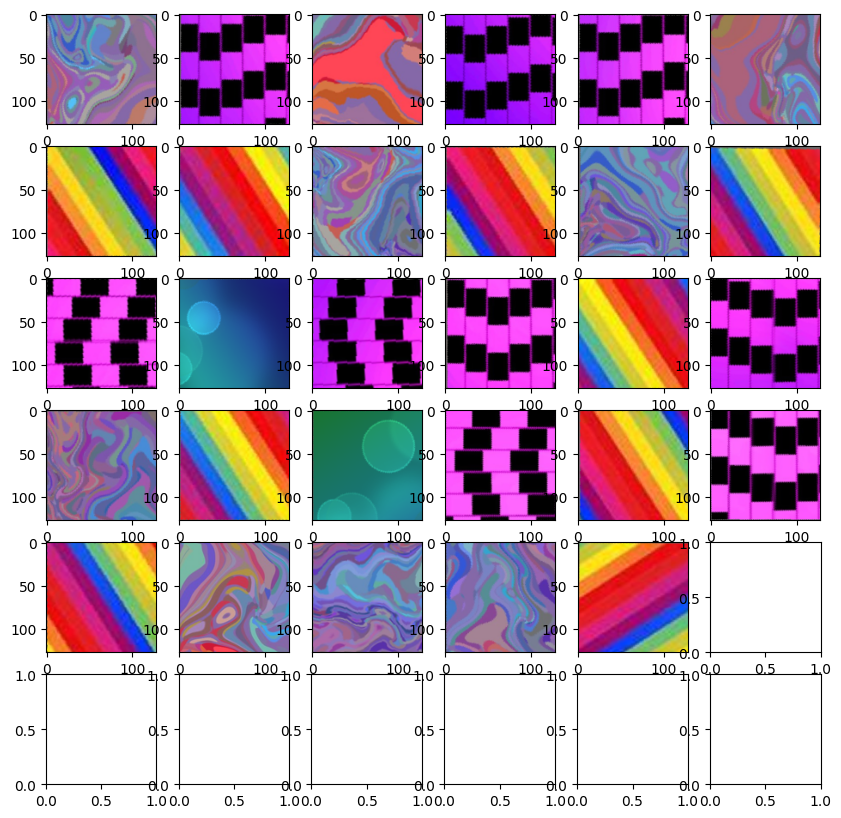

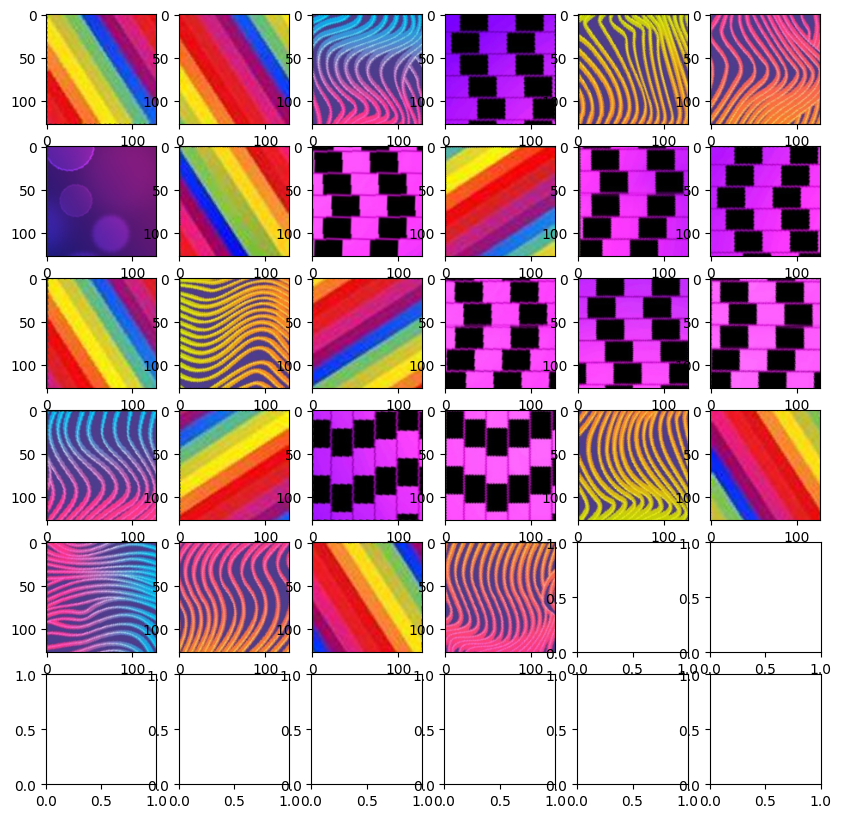

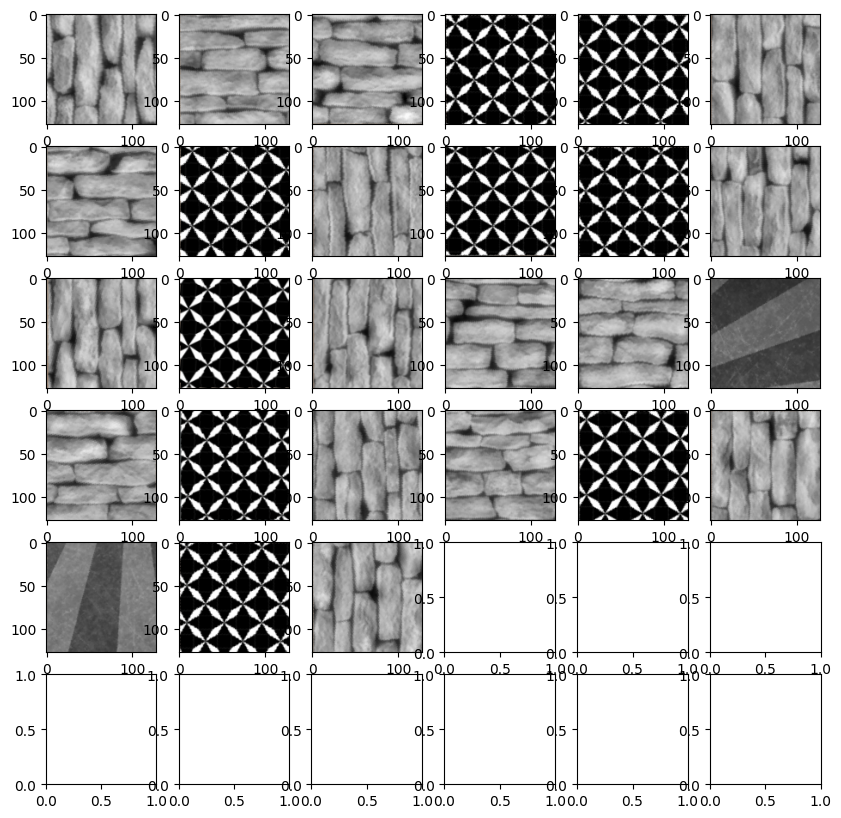

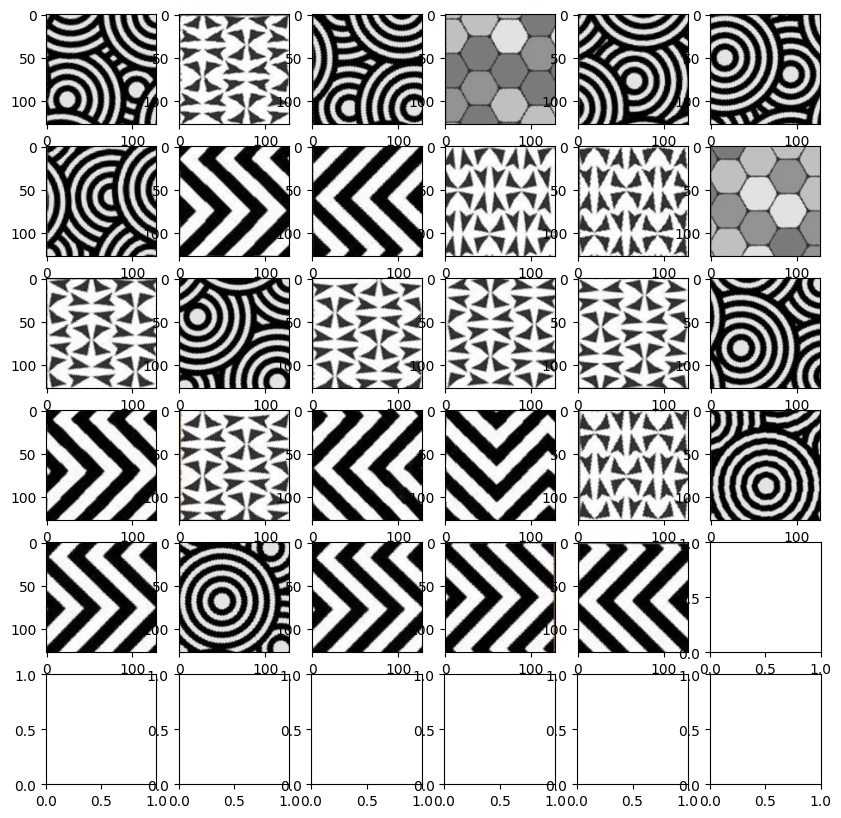

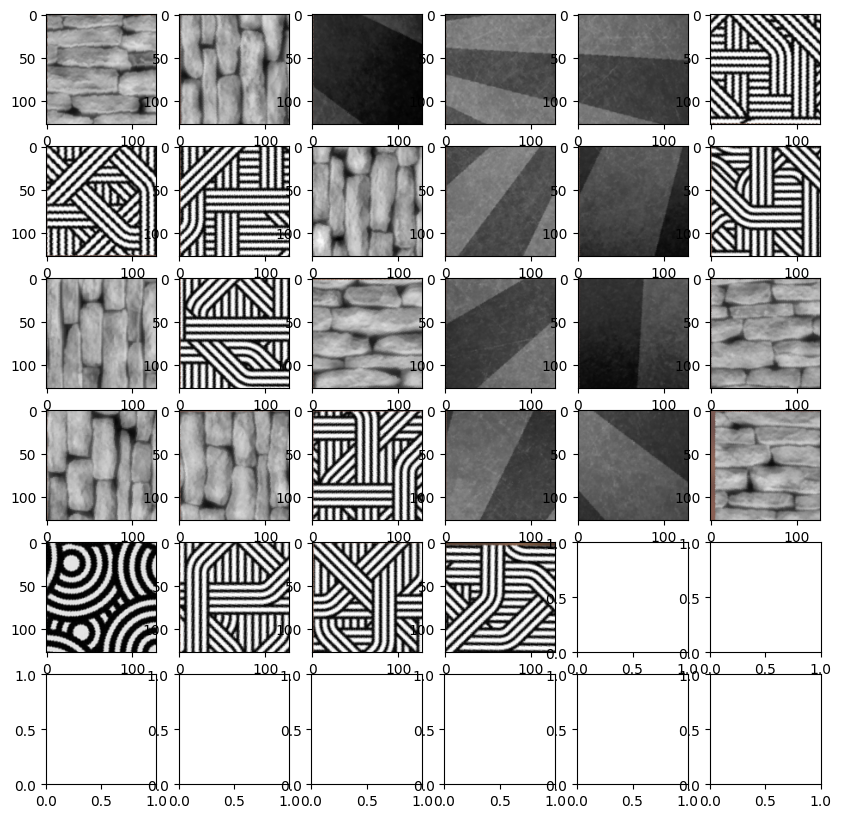

In [7]:
# Load image, grayscale, Gaussian blur, Otsu's threshold
list_of_pieces = [] 
for i in range(11):
    image = load_input_image(image_index=i)
    segmented_bis = segment(image)
    rectangles_bis, mask = get_rectangles(image, segmented_bis)
    
    # plt.imshow(image)
    # plt.title('Original image bis mask')
    # plt.show()

    
    pieces = []
    for rect in rectangles_bis:
        pieces.append(get_piece(image, rect))
    list_of_pieces.append(pieces)
    fig, axs = plt.subplots(6, 6, figsize=(10,10))
    axs = axs.ravel()

    for i, piece in enumerate(pieces):
        axs[i].imshow(piece.data)
    
    
    


# Feature extraction

In [80]:
from skimage.filters import gabor
from scipy.stats import kurtosis, skew


#def extract_gabor_features(image, orientations=8, scales=(1, 3, 5, 7), lambdas=np.arange(0.001, np.pi, np.pi / 4), gammas=(0.05, 0.5)):
def extract_gabor_features(image, orientations=4, scales=(3, 5), lambdas=np.arange(0.1, np.pi, np.pi / 2), gammas=(0.1, 0.5)):
    """
    Extract Gabor features from an image using Gabor filters.
    
    Parameters:
        - image: Input image for feature extraction.
        - orientations: Number of orientations for the Gabor filters.
        - scales: Scales of the Gabor filters.
        - lambdas: Spatial frequencies (wavelengths) of the Gabor filters.
        - gammas: Spatial aspect ratios of the Gabor filters.
    
    Returns:
        - features: Extracted Gabor features as a 1D numpy array.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float64)
    feature_lists = []
    
    for theta in range(orientations):
        theta_radians = theta / orientations * np.pi
        for sigma in scales:
            for lambd in lambdas:
                for gamma in gammas:
                    try:
                        # Create the Gabor kernel
                        kernel_real, kernel_imag = gabor(gray, frequency=1/lambd, theta=theta_radians, sigma_x=sigma, sigma_y=sigma)
                    
                        # Apply the Gabor filter to the image and get the filtered response
                        filtered = np.abs(cv2.filter2D(gray, cv2.CV_64F, kernel_real))  # Magnitude response
                        
                        # Calculate statistical measures from the filtered response
                        mean = np.mean(filtered)
                        std = np.std(filtered)
                        skewness = skew(filtered.flatten())
                        
                        # Append the features to the corresponding feature list
                        feature_lists.append([mean, std, skewness])
                        
                    except (ZeroDivisionError, ValueError, RuntimeWarning) as e:
                        # Handle the specific error or warning here
                        # For example, you can skip the iteration or assign a default value
                        print("Error encountered with parameters:")
                        print("Theta:", theta)
                        print("Sigma:", sigma)
                        print("Lambda:", lambd)
                        print("Gamma:", gamma)
                        print("Error message:", str(e))
    
    # Concatenate the feature lists into a single feature vector
    features = np.concatenate(feature_lists)
    
    # Normalize the feature vector
    features /= np.max(features)
    return features

def extract_histogram_features(image, color_space='RGB', normalize='total', preprocessing_method=None):
    if preprocessing_method is not None:
        # Apply the selected preprocessing method
        if preprocessing_method == 'denoise':
            # Apply denoising using cv2.fastNlMeansDenoisingColored()
            image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
        elif preprocessing_method == 'equalize':
            # Apply histogram equalization using cv2.equalizeHist()
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            image = cv2.equalizeHist(image)
        elif preprocessing_method == 'blur':
            # Apply Gaussian blur using cv2.GaussianBlur()
            image = cv2.GaussianBlur(image, (5, 5), 0)
        else:
            raise ValueError('Invalid preprocessing method')    
    if color_space == 'RGB':
        # Split RGB channels
        r, g, b = cv2.split(image)
        # Compute the histogram for each RGB channel
        hist_r = np.histogram(r.ravel(), bins=256, range=(0, 255))[0]
        hist_g = np.histogram(g.ravel(), bins=256, range=(0, 255))[0]
        hist_b = np.histogram(b.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_r, hist_g, hist_b])
    elif color_space == 'LAB':
        # Convert to LAB color space
        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        
        # Split LAB channels
        l, a, b = cv2.split(lab_image)
        
        # Compute the histogram for each LAB channel
        hist_l = np.histogram(l.ravel(), bins=256, range=(0, 255))[0]
        hist_a = np.histogram(a.ravel(), bins=256, range=(0, 255))[0]
        hist_b = np.histogram(b.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_l, hist_a, hist_b])
    elif color_space == 'HSV':
        # Convert to HSV color space
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        
        # Split HSV channels
        h, s, v = cv2.split(hsv_image)
        
        # Compute the histogram for each HSV channel
        hist_h = np.histogram(h.ravel(), bins=256, range=(0, 255))[0]
        hist_s = np.histogram(s.ravel(), bins=256, range=(0, 255))[0]
        hist_v = np.histogram(v.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_h, hist_s, hist_v])

    # Normalize the histograms
    if normalize == 'individual':
        # Normalize each channel individually
        if color_space == 'RGB':
            hist_r = hist_r / np.sum(hist_r)
            hist_g = hist_g / np.sum(hist_g)
            hist_b = hist_b / np.sum(hist_b)
            hist_normalized = np.concatenate([hist_r, hist_g, hist_b])
        elif color_space == 'LAB':
            hist_l = hist_l / np.sum(hist_l)
            hist_a = hist_a / np.sum(hist_a)
            hist_b = hist_b / np.sum(hist_b)
            hist_normalized = np.concatenate([hist_l, hist_a, hist_b])
        elif color_space == 'HSV':
            hist_h = hist_h / np.sum(hist_h)
            hist_s = hist_s / np.sum(hist_s)
            hist_v = hist_v / np.sum(hist_v)
            hist_normalized = np.concatenate([hist_h, hist_s, hist_v])

    else:
        # Normalize the concatenated histogram
        hist_normalized = hist / np.sum(hist)

    return hist_normalized

def check_has_nan(array):
    # Check if the array contains NaN values
    has_nan = np.isnan(array).any()
    if has_nan:
        return True
    else:
        return False

In [106]:


test_pieces=list_of_pieces[3]
pieces=test_pieces

features = []

for piece in pieces:
    #features.append(piece.data.flatten())
    gabor_feat=np.array(extract_gabor_features(piece.data))
    #print(f"gabor: {gabor_feat.shape}")
    if check_has_nan(gabor_feat):
        print("piece has nan in gabor")
    
    hist_feat=np.array(extract_histogram_features(piece.data))
    #print(f"hist: {hist_feat.shape}")
    if check_has_nan(hist_feat):
        print("piece has nan in hist")
    
    full_feat=np.concatenate((gabor_feat,hist_feat))
    #print(full_feat.shape)
    features.append(full_feat)

#features = np.nan_to_num(np.array(features))
#features=np.concatenate(features)
print(len(pieces))
print(np.array(features).shape)

### Save the Feature Map of Dimension NxM where N is the number of pieces and M is the number of features

21
(21, 864)


In [107]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principal_components = pca.fit_transform(features)

# Clustering

In [108]:
from sklearn.cluster import KMeans

def cluster_puzzle_pieces(features, k):
    # Perform k-means clustering on the features
    kmeans = KMeans(n_clusters=k, random_state=0).fit(features)
    
    # Get the cluster labels and centroids
    labels = kmeans.labels_
    
    return labels


from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def cluster_features(features, max_clusters):
    """
    Cluster the given features using K-means algorithm with the optimal number of clusters determined by the Silhouette Score.
    
    Parameters:
        - features: Feature matrix with shape (num_samples, num_features).
        - max_clusters: Maximum number of clusters to consider.
    
    Returns:
        - labels: Cluster labels for each sample.
    """
    
    silhouette_scores = []
    
    # Perform K-means clustering for different number of clusters
    for num_clusters in range(2, max_clusters+1):
        kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
        labels = kmeans.fit_predict(features)
        silhouette_scores.append(silhouette_score(features, labels))
    
    # Determine the optimal number of clusters based on the Silhouette Score
    optimal_num_clusters = 2 + silhouette_scores.index(max(silhouette_scores))
    
    # Perform clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=optimal_num_clusters, n_init=10, random_state=42)
    labels = kmeans.fit(features).labels_
    
    return labels

In [109]:
#labels = cluster_puzzle_pieces(principal_components, k=4)
labels = cluster_features(features, max_clusters=6)
for i, label in enumerate(labels):
    pieces[i].label = label

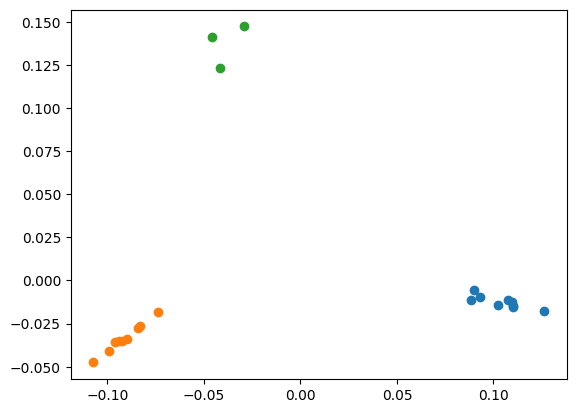

In [110]:
plt.figure()
for i in np.unique(labels):
    plt.scatter(principal_components[labels == i,0], principal_components[labels == i,1])
plt.show()

[9 9 3]
[0 1 2]
2
[0 1]


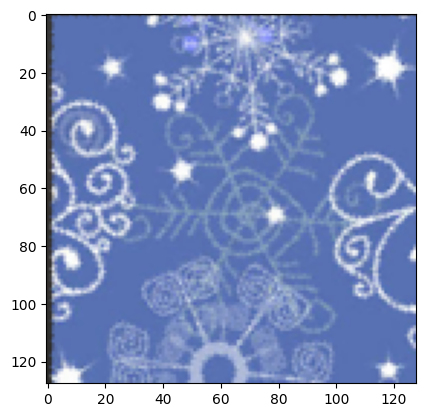

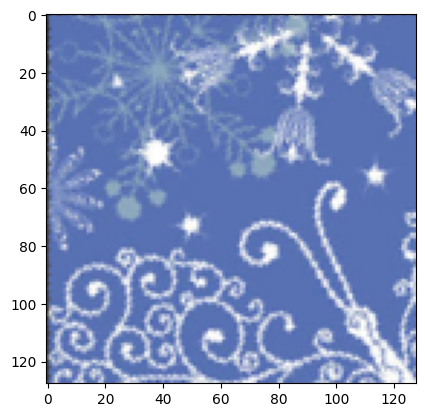

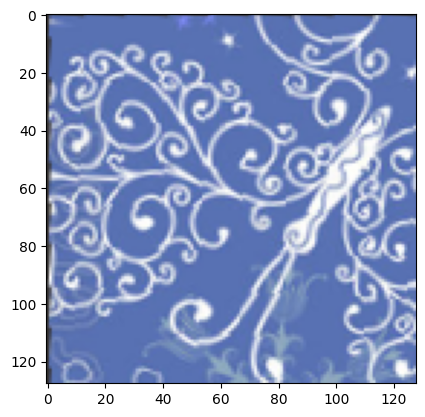

In [111]:
num_outliers_max=3
# Count the occurrences of each cluster
cluster_counts = np.bincount(labels)
print(cluster_counts)
cluster_list=np.arange(len(cluster_counts))
print(cluster_list)
# Find the index of the cluster with the least occurrences
if cluster_counts[np.argmin(cluster_counts)] <= num_outliers_max: 
    outlier_cluster = np.argmin(cluster_counts)
else:
    outlier_cluster = None
print(outlier_cluster)

valid_cluster_list=cluster_list[cluster_list!=outlier_cluster]
print(valid_cluster_list)

for piece in pieces:
    if piece.label == outlier_cluster:
        plt.imshow(piece.data)
        plt.show()


valid cluster 0


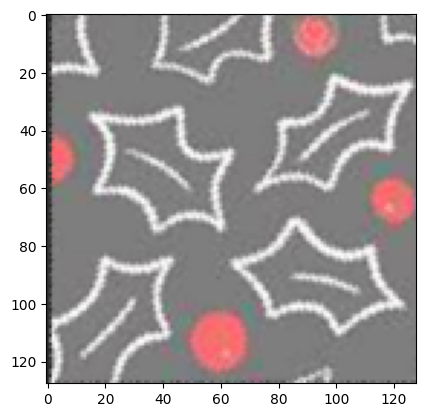

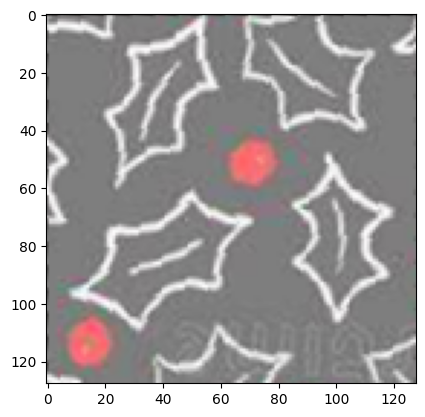

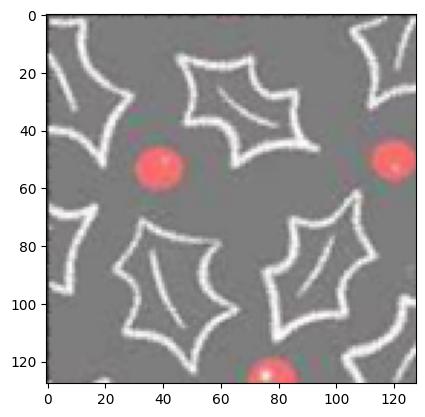

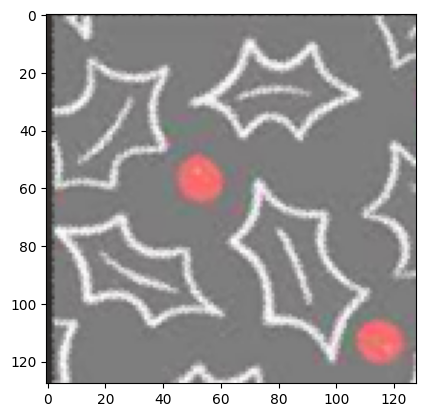

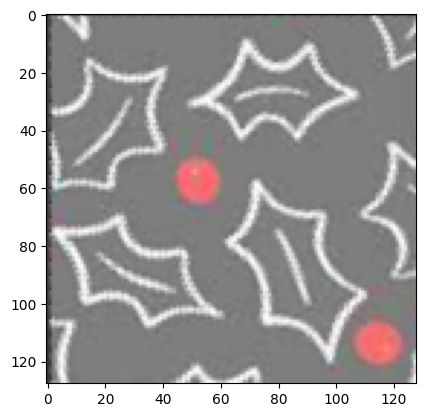

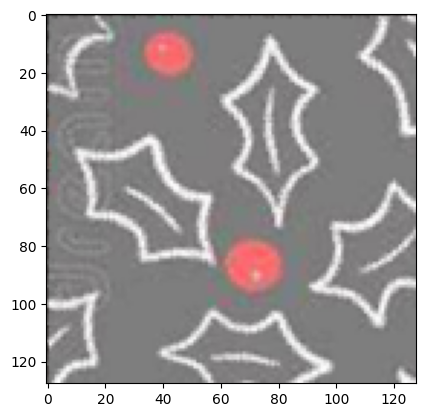

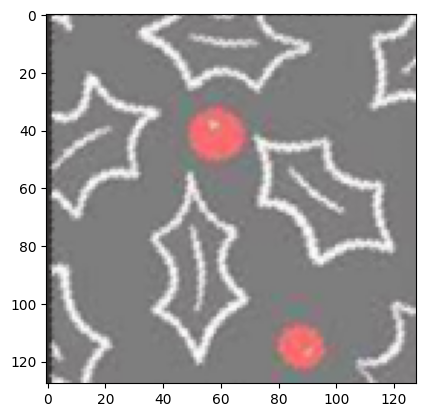

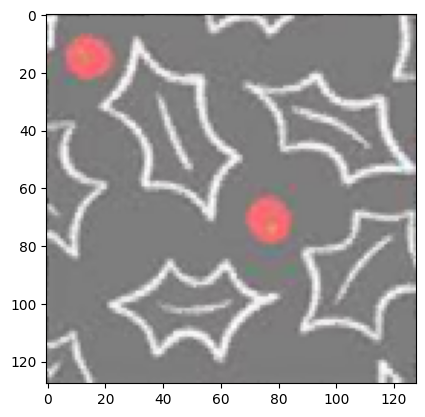

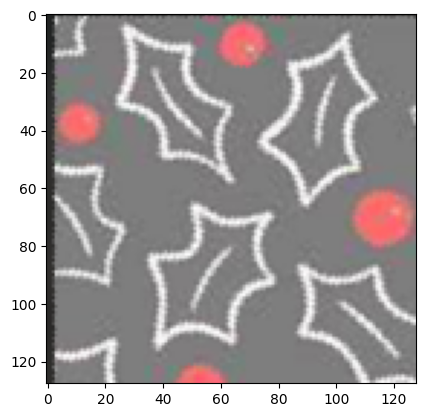

valid cluster 1


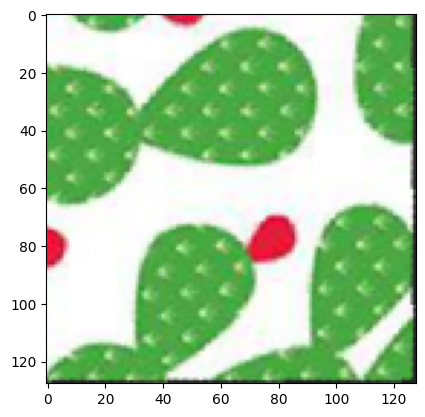

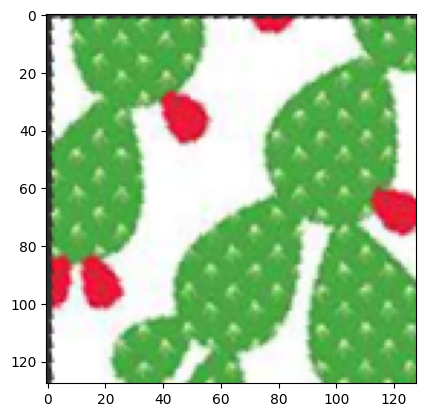

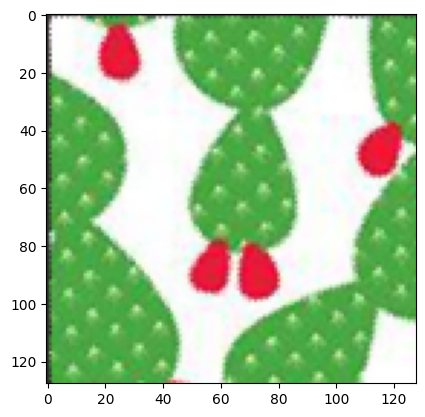

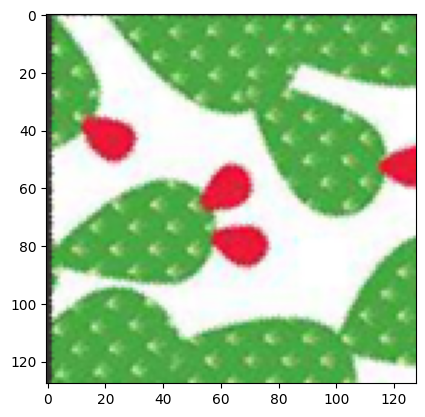

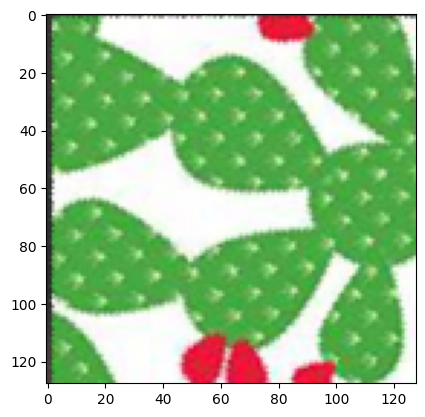

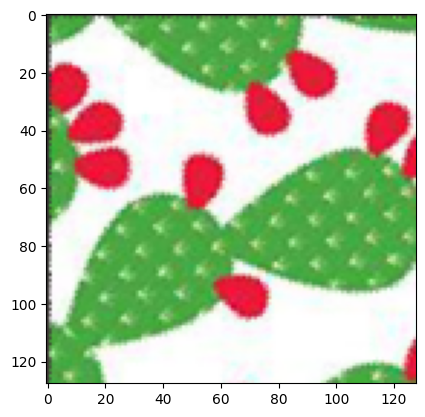

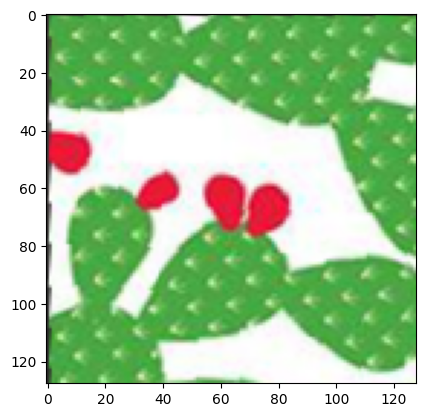

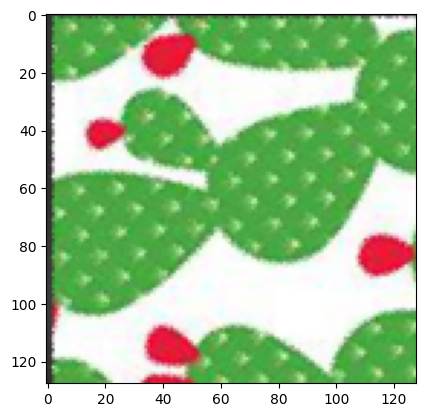

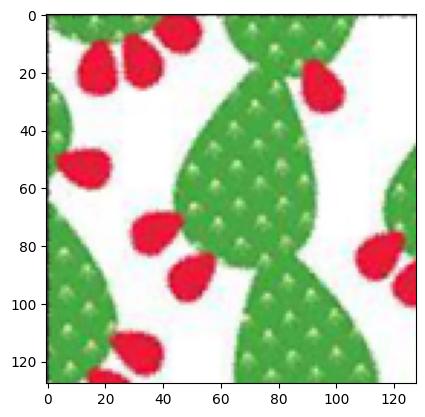

In [112]:
for valid_cluster in valid_cluster_list: 
    print(f"valid cluster {valid_cluster}")
    for piece in pieces:
        if piece.label == valid_cluster:
            plt.imshow(piece.data)
            plt.show()

# Solve tiling puzzle

In [119]:
class Puzzle:
    def __init__(self, pieces):
        if len(pieces) not in [9, 12, 16]:
            raise ValueError(f'Invalid number of pieces, puzzle should be composed of 9, 12 or 16 pieces but got {len(pieces)} pieces.')
        
        self.pieces = pieces
        
        if len(pieces) == 9:
            self.data = np.zeros((384, 384, 3), dtype=pieces[0].data.dtype)
            self.size = (3, 3)
        
        elif len(pieces) == 12:
            self.data = np.zeros((384, 512, 3), dtype=pieces[0].data.dtype)
            self.size = (3, 4)
        
        elif len(pieces) == 16:
            self.data = np.zeros((512, 512, 3), dtype=pieces[0].data.dtype)
            self.size = (4, 4)
    
    def solve(self):
        raise NotImplementedError
    
    def assemble(self):
        for idx, piece in enumerate(self.pieces):
            i = idx // self.size[0]
            j = idx % self.size[1]
            self.data[128*i:128*(i+1), 128*j:128*(j+1), :] = piece.data

In [120]:
from itertools import compress

puzzles = []
outliers = []
for label in np.unique(labels):
    if (labels == label).sum() not in [9, 12, 16]:
        outliers.extend(list(compress(pieces, labels == label)))
    else:
        puzzle = Puzzle(list(compress(pieces, labels == label)))
        puzzles.append(puzzle)

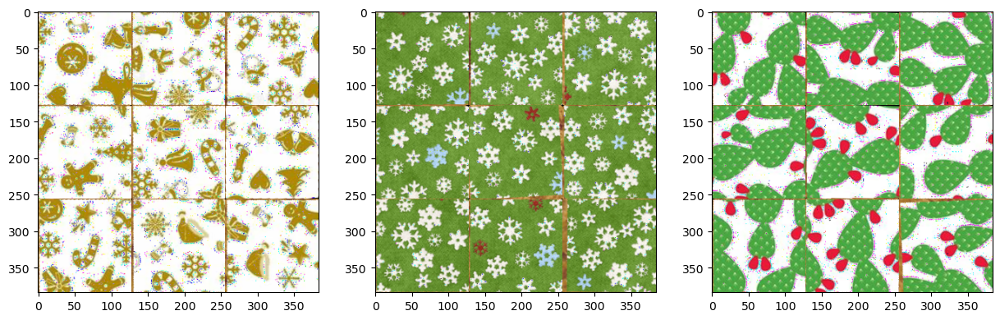

In [121]:
fig, axs = plt.subplots(1, 3, figsize=(15,15))
axs = axs.ravel()

for i, puzzle in enumerate(puzzles):
    puzzle.assemble()
    axs[i].imshow(puzzle.data)